## Introduction

In these notes we discuss the computation of reachable states for a linear time-invariant system with uncertain inputs. The set representation used are zonotopes, but the approach is quite general.

We begin by defining an example that is used throughout these notes. Then, we compute some trajectories of the nondeterministic system by random sampling. Then we move on to consider the computation of reachable states of the homogeneous system. Later, we generalize this approach to the case where the system is not homogeneous.

---

**References.**

This notebook follows closely the presentation in [Section 3, 1]. For the original papers and complementary material see [2-5].

[1] Althoff, Matthias. Reachability analysis and its application to the safety
assessment of autonomous cars. Diss. Technische Universität München, 2010.

[2] T. Dang. Verification et synthese des systemes hybrides. PhD thesis, Institut National Polytechnique de Grenoble, 2000.

[3] A. Girard. Reachability of uncertain linear systems using zonotopes. In Hybrid Systems: Computation and Control, LNCS 3414, pages 291–305. Springer, 2005.

[4] A. Girard, C. Le Guernic, and O. Maler. Efficient computation of reachable sets of linear time-invariant systems with inputs. In Hybrid Systems: Computation and Control, LNCS 3927, pages 257–271. Springer, 2006.

[5] C. Le Guernic. Reachability Analysis of Hybrid Systems with Linear Continuous Dynamics. PhD thesis, Univerit ́e Joseph Fourier, 2009.

### Running example

To fix ideas, consider the example from section 3.2.3 of [1]. This is a linear ODE with nondeterministic initial set and input set:
$$
x'(t) = Ax(t) + bu(t),
$$
where:

- $x(0) \in \mathcal{X}_0 = \{(x, y) \in \mathbb{R}^2: 0.9 \leq x \leq 1.1,~~0.9 \leq y \leq 1.1\}$, and
- $u(t) \in \mathcal{U} = [-0.1, 0.1] \subset \mathbb{R}$.

The matrices $A$ and $b$ are defined below.

In [1]:
using LazySets, MathematicalSystems

# illustrative example from Section 3.2.3
A = 5*[-1. -4.;
        4. -1.]
b = hcat([1., 1])
𝒰 = Interval(-0.1, 0.1)

𝒮 = ConstrainedLinearControlContinuousSystem(A, b, nothing, 𝒰)  # @system x' = A*x + B*u, u ∈ 𝒰

ConstrainedLinearControlContinuousSystem{Float64,Array{Float64,2},Array{Float64,2},Nothing,Interval{Float64,IntervalArithmetic.Interval{Float64}}}([-5.0 -20.0; 20.0 -5.0], [1.0; 1.0], nothing, Interval{Float64,IntervalArithmetic.Interval{Float64}}([-0.100001, 0.100001]))

Let's check the stability of the system:

In [2]:
using LinearAlgebra

In [3]:
eigvals(A)

2-element Array{Complex{Float64},1}:
 -5.0 + 20.000000000000004im
 -5.0 - 20.000000000000004im

Since the eigenvalues of $A$ have negative real part, the system is [Hurwitz-stable](https://en.wikipedia.org/wiki/Hurwitz_matrix), and the solutions converge to the origin.

## Trajectories of the homogeneous solution

The homogeneous system correspons to taking zero inputs, i.e. the homogeneous solutions satisfy the following system of ODEs:
$$
x'(t) = Ax(t),\qquad x(0) \in \mathcal{X}_0.
$$

First, let's draw some trajectories of the homogeneous system. We'll consider a random sample from the input set $\mathcal{U}$ and a random sample from the set of initial conditions $\mathcal{X}_0$.

In [4]:
using Distributions

In [5]:
𝑈 = Uniform(0.9, 1.1)
𝒳ₒ = rand(𝑈, 2)  # pick random sample for the initial states

2-element Array{Float64,1}:
 1.0896339813172626
 0.9312145808793081

Let's calculate some trajectories using the `DifferentialEquations` package. For a linear system one can define an ODE problem through a specific `DiffEqArrayOperator` that takes the coefficients matrix `A`.

In [6]:
using DifferentialEquations
using Plots
import DiffEqOperators.DiffEqArrayOperator

time_span = (0.0, 5.0)
HOM = ODEProblem(DiffEqArrayOperator(A), 𝒳ₒ, time_span)
dt = 0.001 # integration step size
sol = solve(HOM, Euler(), dt=dt)

# unrwap solution
x_sol = [Xk[1] for Xk in sol.u]
y_sol = [Xk[2] for Xk in sol.u]
time = sol.t;

length(sol.u)

5001

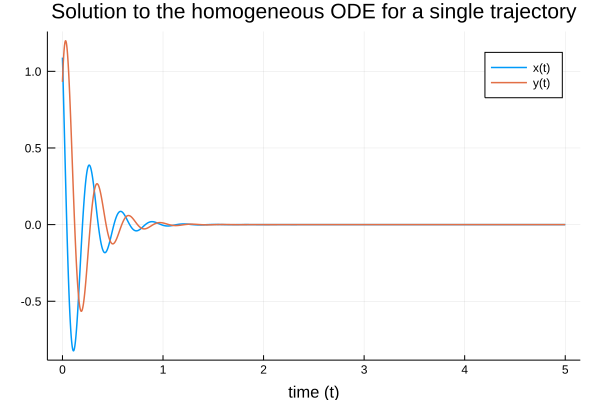

In [7]:
plot(time, x_sol, linewidth=1.5, title="Solution to the homogeneous ODE for a single trajectory",
             xaxis="time (t)", label="x(t)")

plot!(time, y_sol, linewidth=1.5, label="y(t)")

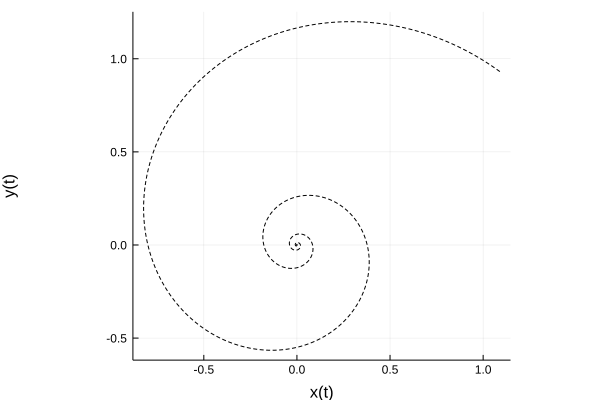

In [8]:
# solution in phase-space
plot(x_sol, y_sol, label="", xaxis="x(t)", yaxis="y(t)", color="black", style=:dash, aspectratio=1)

Let us now repeat the producedure, but producing a *bunch* of trajectories for given initial conditions and input sets. For simplicity, we consider the case of constant input, i.e. the input is chosen at random at the beginning and this value is kept through the simulation.

In [9]:
NExperiments = 80
time_span = (0.0, 5.0)
sol_all = []
for i in 1:NExperiments
    𝒳ₒ = rand(𝑈, 2)
    HOM = ODEProblem(DiffEqArrayOperator(A), 𝒳ₒ, time_span)
    push!(sol_all, solve(HOM, Euler(), dt=dt))
end
time = sol_all[1].t;

In [10]:
x_t = plot()
x_y = plot()
x_sol_all = []
y_sol_all = []
for i in 1:NExperiments
    x_sol = [Xk[1] for Xk in sol_all[i].u]
    y_sol = [Xk[2] for Xk in sol_all[i].u]
    plot!(x_t, time, x_sol, linewidth=0.05, xaxis="time (t)", yaxis="x(t)", label="")
    plot!(x_y, x_sol, y_sol, linewidth=0.05, xaxis="x(t)", yaxis="y(t)", label="", aspectratio=1)

    push!(x_sol_all, x_sol)
    push!(y_sol_all, y_sol)
end

In [11]:
x_t

In [12]:
x_y

## Flowpipe approximation of the homogeneous solution

### Notation

Let us define some notation. Consider a nondeterministic dynamical system $x'(t) = f(x(t), u(t))$, where:

- $t$ is time, often $t \in [0, T]$,
- $u$ is the input bounded by a set $u \in \mathcal{U} \subset \mathbb{R}^m$

The reachable set at a certain point in time, $r$, is defined as the union of possible system states at $t = r$:

$$
\mathcal{R}(\delta) = \left\{ x(\delta) = \int_0^\delta f(x(t), u(t)) dt ~:~x(t) \in \mathcal{X}_0,~~u([0, \delta]) \in \mathcal{U}\right\}.
$$
Here $u([0, \delta]) := \bigcup\limits_{t \in [0, \delta]} u(t)$.

The reachable set for a time interval is defined as the union of reachable sets at points in time withing the interval $t \in [0, \delta]$:

$$
\mathcal{R}([0, \delta]) = \bigcup\limits_{t \in [0, \delta]} \mathcal{R}(t).
$$

The purpose of reachability analysis is to compute an approximation of the set $\mathcal{R}([0, \delta])$.

For the LTI system $x'(t) = Ax(t) + Bu(t)$, the solution is written wlog as $x(t) = x^h(t) + x^p(t)$, where:

- $x^h(t)$ is the homogeneous solution
    - $x(0) = x_0$
    - there is no input $u=0$
    - let $\mathcal{H}^\mathcal{R}(\cdot)$ be the reachable set of the homogeneous solution
- $x^p(t)$ is the particular solution
    - the initial state is in the origin, $x(0) = 0$
    - $u \neq 0$
    - let $\mathcal{P}^\mathcal{R}(\cdot)$ be the reachable set of the inhomogeneous solution

The reachable set of the system is then obtained by Minkowski addition of the reachable set of the homogeneous and the inhomogeneous solution,
$$
\mathcal{R}(t) = \mathcal{H}^\mathcal{R}(t) \oplus \mathcal{P}^\mathcal{R}(t) := \{x^h(t) + x^p(t)~~:~~x^h(t) \in \mathcal{H}^\mathcal{R}(t),~x^p(t) \in \mathcal{P}^\mathcal{R}(t)\}.
$$

### Time point solution

The (trajectory) solution for a given point $x(0) = x_0$ of the homogeneous solution is
$$
x^h(\delta) = e^{A\delta}x_0,\qquad \delta \geq 0.
$$

The reachable set of the homogeneous solution at the point $t=r$ is
$$
\mathcal{H}^\mathcal{R}(\delta) = e^{A\delta} \mathcal{X}_0.
$$

Here, $e^{A\delta} \mathcal{X}_0$ is the set operation *linear map* of the set $\mathcal{X}_0$ whose implementation depends on the set representation used.

For example, suppose that we represent $\mathcal{X}_0$ as a **zonotope**. See the documentation of zonotope, `?Zonotope`, for some examples.

In [13]:
using LazySets

In [47]:
# create a zonotope given its center and generators
𝒳ₒ = Zonotope([1.0, 1.0], Diagonal([0.1, 0.1]))

Zonotope{Float64}([1.0, 1.0], [0.1 0.0; 0.0 0.1])

In [48]:
# since the matrix of generators is diagonal, this zonotope is just a box
vertices_list(𝒳ₒ)

4-element Array{Array{Float64,1},1}:
 [1.1, 1.1]
 [0.9, 1.1]
 [1.1, 0.9]
 [0.9, 0.9]

Let's calculate the action of the matrix exponential $e^{A\delta}$ over the zonotope:

In [49]:
δ = 0.04 # time step

M = exp(A * δ) # calculate matrix exponential

2×2 Array{Float64,2}:
 0.570415  -0.587321
 0.587321   0.570415

The *lazy* linear map is obtained with the `*` operation, or the more verbose `LinearMap`:

In [50]:
M * 𝒳ₒ

LazySets.LinearMap{Float64,Zonotope{Float64},Float64,Array{Float64,2}}([0.570415 -0.587321; 0.587321 0.570415], Zonotope{Float64}([1.0, 1.0], [0.1 0.0; 0.0 0.1]))

For the algorithm that follows, we will use concrete operations only. Zonotopes are closed under linear map and we can compute the concrete linear map as follows:

In [51]:
L = linear_map(M, 𝒳ₒ)

Zonotope{Float64}([-0.0169063, 1.15774], [0.0570415 -0.0587321; 0.0587321 0.0570415])

Actually, the linear map of a zonotope is obtained by applying the map to the center and the generators, so the computation scales very well.

In [52]:
L.center == M * 𝒳ₒ.center && L.generators == M * 𝒳ₒ.generators

true

Let's plot the "first step", before (in blue) and after the exponential map (in red):

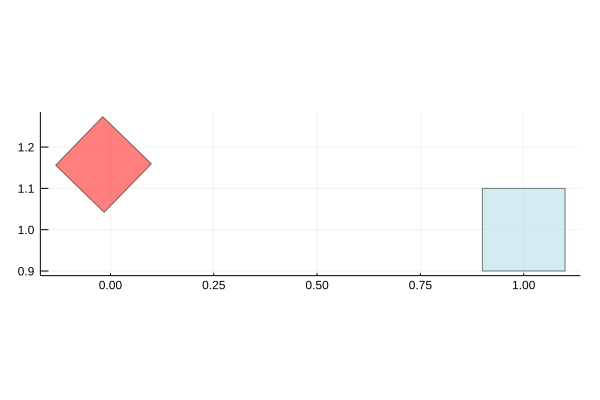

In [53]:
x_y_init = plot(𝒳ₒ, alpha=0.5, aspectratio=1, color="lightblue")
plot!(x_y_init, L, alpha=0.5, color="red")

Now the red set contains the reachable set $\mathcal{H}^\mathcal{R}(\delta) = e^{A\delta} \mathcal{X}_0$, as we show below since the simulations all fall in this set. The approximation for the time points *between* time $0$ and time $\delta$ requires that we take the convex hull and also bloating.

Let's take the convex hull of the transformed zonotope with the initial states; call this set `𝑋ₒ`.

In [54]:
𝑋ₒ = ConvexHull(𝒳ₒ, M * 𝒳ₒ)

ConvexHull{Float64,Zonotope{Float64},LazySets.LinearMap{Float64,Zonotope{Float64},Float64,Array{Float64,2}}}(Zonotope{Float64}([1.0, 1.0], [0.1 0.0; 0.0 0.1]), LazySets.LinearMap{Float64,Zonotope{Float64},Float64,Array{Float64,2}}([0.570415 -0.587321; 0.587321 0.570415], Zonotope{Float64}([1.0, 1.0], [0.1 0.0; 0.0 0.1])))

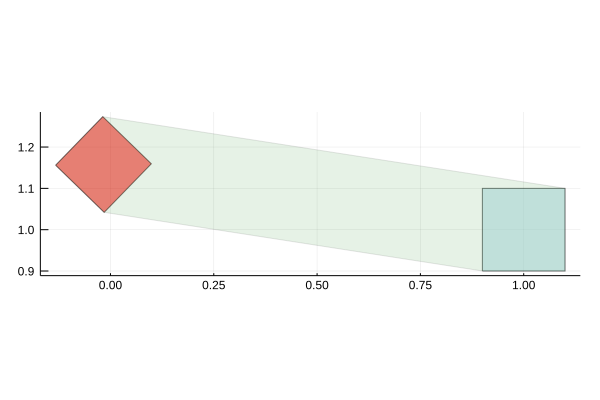

In [55]:
# the region in light green denotes the convex hull of the initial set and the time point solution
plot!(x_y_init, 𝑋ₒ, 1e-3, alpha=0.1, color="green")

Let us draw some trajectories on top of this:

In [56]:
d = round(Int, δ / dt)  # recall that dt is the continuous Euler integration step size
for i in 1:NExperiments
    x_sol = [Xk[1] for Xk in sol_all[i].u]
    y_sol = [Xk[2] for Xk in sol_all[i].u]
    plot!(x_y_init, x_sol[1:d], y_sol[1:d], linewidth=1., xaxis="x(t)", yaxis="y(t)", label="", alpha=0.5)
end

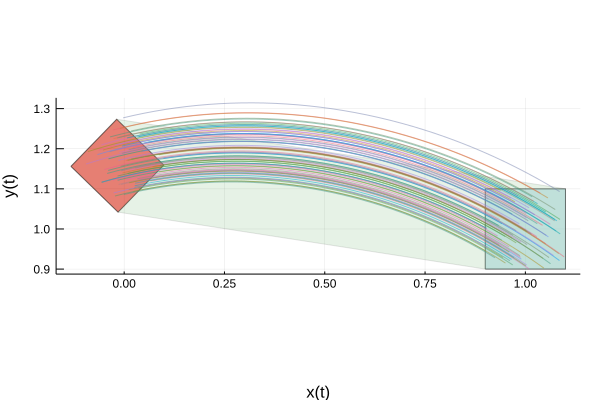

In [57]:
x_y_init

### Time interval solution

We see in the previous plot that one needs to enlarge the convex hull to enclose all the trajectories of the continuous ODE. This process is often called *bloating*. It boils down to taking the *Minkowski sum* with an appropriate set, big enough to include all trajectories of the continuous solution.

The approach in [Proposition 3.1, Section 3, 1] and bloat the convex hull with the correction matrix $F$ applied to the set of initial states. This approach is not yet implemented (see Reachability#).

In [58]:
# compute correction matrix -- TODO
# see IntervalMatrices.jl

In [59]:
Ik = []
for i in [2, 3, 4, 5]
    min_i = (i^(-i/(i-1)) - i^(-1.0/(i-1))) * δ^i
    push!(Ik, Interval(min_i, 0.0))
end
Ik

4-element Array{Any,1}:
 Interval{Float64,IntervalArithmetic.Interval{Float64}}([-0.000400001, 0])
 Interval{Float64,IntervalArithmetic.Interval{Float64}}([-2.46337e-05, 0])
 Interval{Float64,IntervalArithmetic.Interval{Float64}}([-1.20953e-06, 0])
 Interval{Float64,IntervalArithmetic.Interval{Float64}}([-5.47833e-08, 0])

In [60]:
# using IntervalArithmetic

# IntervalArithmetic.Interval(0.0, 1.0) * M

For an alternative way to obtain the initial set of the recurrence we consider the `discretize` function that we have implemented in `Reachability.jl`.

In [61]:
using MathematicalSystems: LinearContinuousSystem
import Reachability
using Reachability: discretize, Options

In [62]:
𝒳ₒ

Zonotope{Float64}([1.0, 1.0], [0.1 0.0; 0.0 0.1])

In [63]:
problem = InitialValueProblem(LinearContinuousSystem(A), 𝒳ₒ)
@time problem_discrete = discretize(problem, δ, algorithm="forward")
Ω0 = problem_discrete.x0;

  0.006932 seconds (7.47 k allocations: 423.329 KiB)


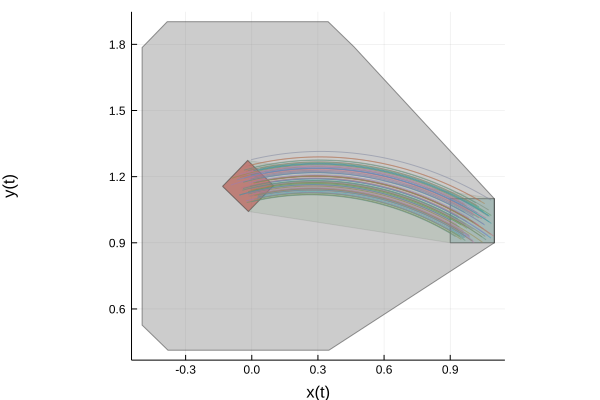

In [64]:
plot!(Ω0, 1e-3, alpha=.4, color="grey")

To reduce the overapproximation, we can choose a smaller step size.

  0.000290 seconds (239 allocations: 25.672 KiB)


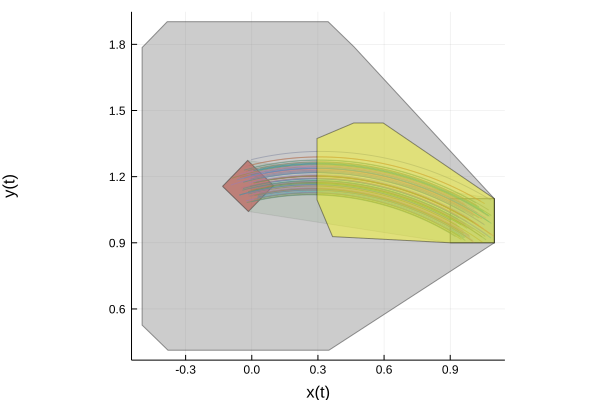

In [65]:
@time problem_discrete = discretize(problem, δ/2, algorithm="forward")
Ω0 = problem_discrete.x0;
plot!(Ω0, 1e-3, alpha=.4, color="yellow")

Below we implement the algorithm to compute the succesors.

In [43]:
using LazySets.Approximations
using Reachability: discretize, Options
using Reachability.ReachSets: exp_Aδ, Φ₂

const LDS = LinearDiscreteSystem

function discretize_interpolation_zonotopes(𝑆::InitialValueProblem{<:AbstractContinuousSystem},
                                            δ::Float64;
                                            algorithm::String="forward",
                                            exp_method::String="base",
                                            sih_method::String="concrete")

    if sih_method == "concrete"
        sih = symmetric_interval_hull
    elseif sih_method == "lazy"
        sih = SymmetricIntervalHull
    else
        throw(ArgumentError("the method $sih_method is unknown"))
    end

    # unrwap coefficient matrix and initial states
    A, X0 = 𝑆.s.A, 𝑆.x0

    # compute matrix ϕ = exp(Aδ)
    ϕ = exp_Aδ(A, δ, exp_method=exp_method)

    # compute the transformation matrix to bloat the initial states
    Phi2Aabs = Φ₂(abs.(A), δ, exp_method=exp_method)

    if algorithm == "forward"
        Einit = sih(Phi2Aabs * sih((A * A) * X0))     # use Eplus
    elseif algorithm == "backward"
        Einit = sih(Phi2Aabs * sih((A * A * ϕ) * X0)) # use Eminus
    else
        throw(ArgumentError("the algorithm $approximation is unknown"))
    end

    # convert the SIH to a zonotope
    Einit = convert(Zonotope, Einit)
    
    # early return for homogeneous systems
    if inputdim(𝑆) == 0
        Z1 = convert(Zonotope, X0)
        Z2 = linear_map(ϕ, minkowski_sum(X0, Einit))
        Ω0 = overapproximate(ConvexHull(Z1, Z2), Zonotope)
        return IVP(LDS(ϕ), Ω0)
    end

    U = inputset(𝑆)
    U0 = next_set(U, 1)
    Eψ0 = convert(Zonotope, sih(Phi2Aabs * sih(A * U0)))

    Z1 = X0
    ϕX0 = linear_map(ϕ, X0)
    δU0 = convert(Zonotope, overapproximate(δ*U0, Hyperrectangle))
    Z2 = reduce(minkowski_sum, [ϕX0, δU0, Eψ0, Einit])
    Ω0 = overapproximate(ConvexHull(Z1, Z2), Zonotope)

    if U isa ConstantInput
        Ud = ConstantInput(minkowski_sum(δU0, Eψ0))
    elseif U isa VaryingInput
        Ud = Vector{LazySet}(undef, length(U))
        for (k, Uk) in enumerate(U)
            Eψk = convert(Zonotope, sih(Phi2Aabs * sih(A * Uk)))
            Ud[k] = minkowski_sum(convert(Zonotope, δ*Uk), Eψk)
        end
        Ud = VaryingInput(Ud)
    else
        throw(ArgumentError("input of type $(typeof(U)) is not allwed"))
    end

    return IVP(CLCDS(ϕ, Id(size(A, 1)), nothing, Ud), Ω0)
end

function post(problem, 𝑂)
    
    N = round(Int, 𝑂[:T] / 𝑂[:δ])

    # discretization
    problem_discrete = discretize_interpolation_zonotopes(problem, 𝑂[:δ], algorithm="forward")

    Ω0 = problem_discrete.x0
    Φ = problem_discrete.s.A

    # preallocate output
    RSets = Vector{Zonotope}(undef, N)
    
    # compute homogeenous case
    reach_homog!(RSets, Ω0, Φ, N, 𝑂[:max_order])
    
    return RSets
end

# linear map computed explicitly => zonotope transformed into zonotope
function reach_homog!(HR::Vector{Zonotope},
                      Ω0::LazySet,
                      Φ::AbstractMatrix,
                      N::Int,
                      max_order::Int)
    
    HR[1] = overapproximate(Ω0, Zonotope)
    k = 1
    while k < N
        HR_next = linear_map(Φ, HR[k])
        if order(HR_next) > max_order
            HR_next = reduce_order(HR_next, max_order)
        end
        HR[k+1] = HR_next
        k = k + 1
    end
    return HR
end

reach_homog! (generic function with 1 method)

In [66]:
problem = InitialValueProblem(LinearContinuousSystem(A), 𝒳ₒ)
𝑂 = Options(:T=>2.0, :δ=>0.01, :max_order=>10)

R = post(problem, 𝑂);

@btime R = post($problem, $𝑂);

  253.667 μs (1133 allocations: 95.11 KiB)


In [34]:
length(R)

200

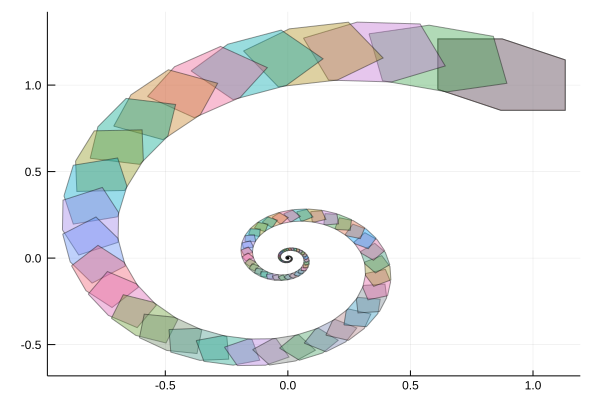

In [35]:
p = plot(R[1], alpha=.4)
for Ri in R
    plot!(p, Ri, alpha=.4)
end
p

In [36]:
using Reachability: BFFPSV18

RSets_BFFPSV18 = Reachability.solve(problem, Options(:T=>2.0), op=BFFPSV18(Options(:δ=>0.01)));

@btime RSets_BFFPSV18 = Reachability.solve($problem, Options(:T=>2.0), op=BFFPSV18(Options(:δ=>0.01)));

  13.866 ms (18890 allocations: 1.17 MiB)


In [37]:
length(RSets_BFFPSV18.Xk)

200

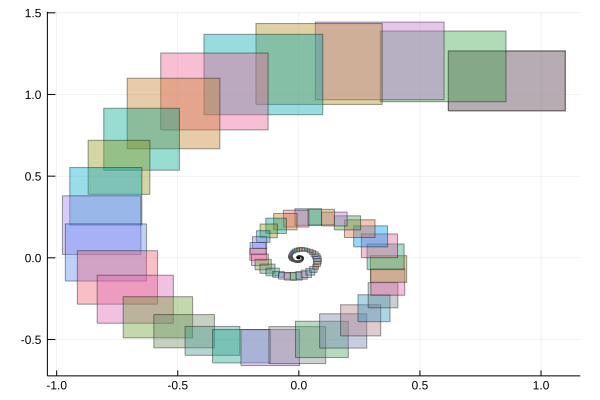

In [38]:
p = plot(RSets_BFFPSV18.Xk[1].X, alpha=.4)
for Ri in RSets_BFFPSV18.Xk
    plot!(p, Ri.X, alpha=.4)
end
p

## Inhomogeneous solution

Now consider the inhomogenous case, $x' = Ax + Bu$, with $u \in U$ a set of non-deterministic inputs.

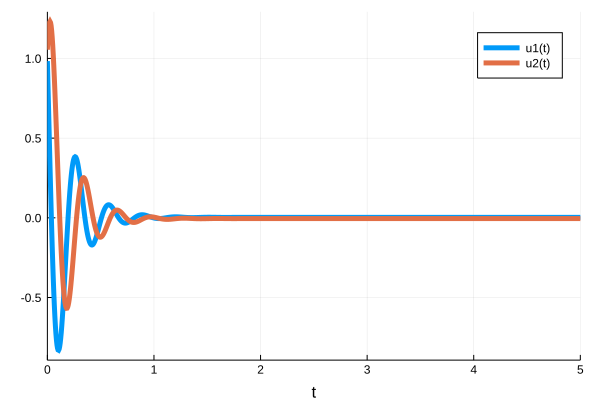

In [39]:
# Computing the trajectories of the inhomogeneous solution

𝑈 = Uniform(0.9, 1.1)
𝒳ₒ = rand(𝑈, 2)  # pick random sample for the initial states
uₒ = rand(Uniform(-0.1, 0.1)) # pick a random sample for the input

Aff = AffineDiffEqOperator{Float64}((A, ), (uₒ, ))

f(x,p,t) = A*x + (b*uₒ)[:, 1]
tspan = (0.0, 5.0)
prob = ODEProblem(f, 𝒳ₒ, tspan)
sol = solve(prob);

plot(sol,  linewidth=5)

## Flowpipe approximation of the inhomogeneous solution